In [1]:
import numpy as np, pandas as pd

X = pd.read_parquet('aliens.parquet')
X

,alfa_popsize,eyebrow_length,fenistraline_length,leash_v2,jacket_size,poloka_dash,holy_spirit,postojka,durk_durk_3d,noopster,...,turilla_jet,weight,moonlight_shadow_angle,jister_ml,leg_pollution,wallet_size,biceps,aga,da,ankle_diameter
0,1273.210288,702.271017,352.754646,231.456804,135.162385,346.578535,70.388229,267.221799,162.812146,21.265403,...,12.817179,15.780798,3988.159803,15.027182,105.348660,77.565442,2231.976885,3356.206251,293.846039,1197.658371
1,1762.800555,552.176524,-348.578448,302.617511,66.096273,263.098188,-8.442866,199.800693,103.495658,29.978779,...,9.937281,12.075288,5292.966511,12.453356,86.882948,78.007788,3301.213697,5074.654575,351.400080,873.291874
2,1154.081932,1119.631765,-36.358379,200.098293,125.907321,334.439139,-20.265494,-519.780573,92.247154,29.199713,...,10.743006,8.756796,3856.035673,9.495362,116.418115,116.255086,3092.423116,3994.874963,335.185582,917.447816
3,1181.661571,1320.341225,293.866657,283.972621,93.459372,187.442851,89.402673,1378.205958,81.806588,35.836450,...,12.429817,11.421948,2717.142060,11.670682,131.664278,83.969841,3367.527054,2292.256561,351.901315,1074.534454
4,751.251638,998.132123,-724.730649,420.987379,60.963099,360.790557,-1.074858,1195.690980,121.554328,31.706275,...,12.065884,13.341130,3085.229342,9.853778,65.249706,100.545740,3612.973208,2899.235214,381.034647,1291.965098
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1137.424408,688.857438,-90.263352,359.489998,129.683610,204.562443,-2.465434,-673.451138,95.645700,30.638093,...,11.031228,11.272852,853.655181,9.978489,67.999854,80.942708,3128.648509,2521.916972,324.780635,741.554471
9996,913.314659,859.295109,-530.187880,245.904131,77.807249,210.272221,25.786245,1590.171122,78.089080,37.442741,...,13.409530,13.714980,2348.817593,11.211519,126.782365,136.199706,3412.368087,3085.193759,371.102727,964.564360
9997,1133.345522,1042.954915,-755.420158,381.826616,116.520283,381.432154,18.509690,915.191240,89.055504,28.955985,...,12.424673,12.504124,2797.610181,11.842874,113.771209,76.383984,2972.426857,2482.928050,185.922537,956.117409
9998,713.240822,830.693428,-45.059154,262.265291,105.215648,321.509325,-19.198133,-647.714991,104.694268,36.520347,...,9.752806,9.727836,2166.196991,14.512985,75.965236,96.475552,4224.427711,1885.344082,320.413597,1465.775898


## 1. tool: EmbeddingPlotter (6 баллов)

Нужно написать функцию, которая принимает на вход 2D/3D эмбеддинг и отрисовывает его (можно и через класс).<br>
Требуемый функционал описан в докстринге.

Нужно заметить, что основные преимущества bokeh в этом задании не нужны, однако использование bokeh для 2D обязательно в целях минимального освоения.
В дальнейшем вы сможете усовершенствовать вашу рисовалку с помощью ColumnDataSource и коллбэков, если захотите.

In [207]:
import numpy as np

import plotly.express as px
import plotly.graph_objects as go

from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, FixedTicker, BooleanFilter, CDSView, HoverTool
from bokeh.io import output_notebook
from bokeh.transform import linear_cmap
from bokeh.palettes import magma, tol

def embedding_plotter(embedding, data=None, hue=None, hover=None):
    '''
    Рисовалка эмбеддинга. 2D renderer: bokeh. 3D renderer: plotly.
    Обязательные инструменты:
        - pan (двигать график)
        - box zoom
        - reset (вылезти из зума в начальное положение)

        embedding: numpy.ndarray, shape (n_samples, n_dimensions)
            Эмбеддинг (2D или 3D)
        data: pd.DataFrame, optional
            Данные, по которым был построен эмбеддинг
        hue: string, optional
            Колонка из data, по которой красим точки
        hover: string or list of strings, optional
            Колонк[а/и] из data, значения которых нужно выводить при наведении мышки на точку
    '''
    plot_hue = False
    make_hover = False
    if data is not None:
        if hue is not None:
            plot_hue = True
            hue_is_categorical = data[hue].nunique() <= 8
        if hover is not None:
            if isinstance(hover, str):
                hover = [hover]
            make_hover = True

    if embedding.shape[1] == 3:  # 3D plotly
        plot_data = pd.DataFrame({'x': embedding[:, 0], 'y': embedding[:, 1], 'z': embedding[:, 2]})

        if plot_hue:
            if hue_is_categorical:
                plot_data[hue] = data[hue].astype(str)
            else:
                plot_data[hue] = data[hue]

        if make_hover:
            for col in hover:
                plot_data[col] = data[col]

        fig = px.scatter_3d(plot_data, x='x', y='y', z='z', color=hue, title="Plotly 3D Embedding", hover_data=hover)

        fig.show()

    else:  # 2D bokeh
        output_notebook()

        plot_data = pd.DataFrame({'x' : embedding[:, 0], 'y' : embedding[:, 1]})

        tools = ['pan', 'wheel_zoom', 'box_select', 'lasso_select', 'box_zoom', 'reset']
        fig = figure(title="Bokeh 2D Embedding", tools=tools)

        if make_hover:
            for col in hover:
                plot_data[col] = data[col]

            tooltips = [(col, f"@{col}") for col in hover]
            fig.add_tools(HoverTool(tooltips=tooltips))

        # source = ColumnDataSource(source_data)

        if not plot_hue:
            fig.scatter(x='x', y='y', size=6, source=plot_data)

        elif hue_is_categorical:
            uniques = np.sort(data[hue].unique()).astype(str)

            n_unique = uniques.shape[0]
            if n_unique == 2:
                palette = tol['Bright'][3][:2]
            elif n_unique == 3:
                palette = tol['HighContrast'][3]
            elif n_unique in tol['Bright']:
                palette = tol['Bright'][n_unique]
            else:
                palette = magma(n_unique)

            for i, hue_val in enumerate(uniques):
                condition = (data[hue].astype(str) == hue_val).tolist()
                view = CDSView(filter=BooleanFilter(condition))

                fig.scatter(x='x', y='y', size=6, source=plot_data,
                            view=view, legend_label=hue_val, color=palette[i])

            fig.legend.click_policy = 'hide'
        else:
            min_val, max_val = data[hue].min(), data[hue].max()
            color = linear_cmap(
                field_name=hue,
                palette=magma(data[hue].nunique()),
                low=min_val,
                high=max_val
            )
            plot_data[hue] = data[hue]

            plot = fig.scatter(x='x', y='y', size=6, source=plot_data, color=color)

            ticks = np.linspace(min_val, max_val, 5).round()
            ticker = FixedTicker(ticks=ticks)
            colorbar = plot.construct_color_bar(title=hue, title_text_font_size='20px', title_text_align='center',
                                                ticker=ticker, major_label_text_font_size='15px')
            fig.add_layout(colorbar, 'below')

        show(fig)

### Сначала сделаем пару тестов на искусственных данных для демонстрации всего функционала.

Построим 3D plotly график с hue - категория.

In [149]:
import pandas as pd
import numpy as np

embedding = np.arange(30).reshape(10, 3)
data = pd.DataFrame({
    'cat': np.random.choice(['X', 'Y', 'Z'], size=10),
    'val1': np.arange(10),
    'val2': np.arange(10)
})

embedding_plotter(embedding, data=data, hue='cat', hover=['val1', 'val2'])

Построим 3D plotly график с hue - числовой.

In [150]:
import pandas as pd
import numpy as np

embedding = np.arange(30).reshape(10, 3)
data = pd.DataFrame({
    'cat': np.arange(10),
    'val1': np.arange(10),
    'val2': np.arange(10)
})

embedding_plotter(embedding, data=data, hue='cat', hover=['val1', 'val2'])

Построим 2D bokeh без hue и hover.

In [190]:
import pandas as pd
import numpy as np

embedding = np.random.randn(100, 2)

embedding_plotter(embedding)

Построим 2D bokeh с hue и hover, где hue - категориальная колонка.

In [191]:
import pandas as pd
import numpy as np

embedding = np.random.randn(100, 2)
data = pd.DataFrame({
    'cat': np.random.choice(['A', 'B', 'C'], size=100),
    'val': np.random.randn(100)
})

embedding_plotter(embedding, data=data, hue='cat', hover=['val'])

Построим 2D bokeh с hue и hover, где hue - числовая колонка.

In [209]:
import pandas as pd
import numpy as np

embedding = np.random.randn(100, 2)
data = pd.DataFrame({
    'cat': np.arange(100),
    'val': np.arange(100)
})

embedding_plotter(embedding, data=data, hue='cat', hover=['val'])

Приведите пример работы рисовалки на 2D и 3D данных. В качестве эмбеддингов возьмите какие-нибудь признаки из данных выше.

In [221]:
X_emb = X.iloc[:, :2]
X_emb.head()

,alfa_popsize,eyebrow_length
0,1273.210288,702.271017
1,1762.800555,552.176524
2,1154.081932,1119.631765
3,1181.661571,1320.341225
4,751.251638,998.132123


In [222]:
embedding_plotter(X_emb.to_numpy(), X, hover='postojka')

**! Если вы написали рисовалку, используйте ее в части 2 для отрисовки эмбеддингов**

## 2 Инопланетное вторжение

В разгар войны с инопланетянами в сеть утекли данные о десяти тысячах инопланетных особей, описанных странными показателями.
Никто не знает, что они значат, но все видят своими глазами, что среди инопланетян встречается пять существенно отличающихся видов, а также особи, которые трудно отнести к какому-либо виду.
Ваша задача по полученным данным произвести кибер-разведку и определить, к какому из видов относится каждый представленный в табличке субъект. Вы не знаете, как называются виды и чем именно из представленного в табличке они отличаются, но есть специалисты, готовые взять на себя подобную расшифровку.
Ваша задача - предоставить им разбиение данной таблички на кластеры (возможно, с шумом), чтобы они смогли начать анализ.

In [223]:
X.head()

,alfa_popsize,eyebrow_length,fenistraline_length,leash_v2,jacket_size,poloka_dash,holy_spirit,postojka,durk_durk_3d,noopster,...,turilla_jet,weight,moonlight_shadow_angle,jister_ml,leg_pollution,wallet_size,biceps,aga,da,ankle_diameter
0,1273.210288,702.271017,352.754646,231.456804,135.162385,346.578535,70.388229,267.221799,162.812146,21.265403,...,12.817179,15.780798,3988.159803,15.027182,105.348660,77.565442,2231.976885,3356.206251,293.846039,1197.658371
1,1762.800555,552.176524,-348.578448,302.617511,66.096273,263.098188,-8.442866,199.800693,103.495658,29.978779,...,9.937281,12.075288,5292.966511,12.453356,86.882948,78.007788,3301.213697,5074.654575,351.400080,873.291874
2,1154.081932,1119.631765,-36.358379,200.098293,125.907321,334.439139,-20.265494,-519.780573,92.247154,29.199713,...,10.743006,8.756796,3856.035673,9.495362,116.418115,116.255086,3092.423116,3994.874963,335.185582,917.447816
3,1181.661571,1320.341225,293.866657,283.972621,93.459372,187.442851,89.402673,1378.205958,81.806588,35.836450,...,12.429817,11.421948,2717.142060,11.670682,131.664278,83.969841,3367.527054,2292.256561,351.901315,1074.534454
4,751.251638,998.132123,-724.730649,420.987379,60.963099,360.790557,-1.074858,1195.690980,121.554328,31.706275,...,12.065884,13.341130,3085.229342,9.853778,65.249706,100.545740,3612.973208,2899.235214,381.034647,1291.965098


### 2.1 Понижение размерности (4 балла)

Чтобы быть уверенным в своей кластеризации, нужно иметь возможность посмотреть на нее глазами, поэтому для начала постараемся получить 2D-эмбеддинг нашей таблички.
Сделайте это на всех признаках с помощью PCA и t-SNE/UMAP с адекватными гиперпараметрами (2 разных картинки). Сделайте необходимую предобработку. Отрисуйте это вашей рисовалкой из первой части, если вы ее сделали. Что вы видите?

Нормализуем данные и обучим t-SNE и UMAP на "базовых" параметрах.

In [224]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [227]:
#!pip install --upgrade opentsne

In [228]:
#!pip install hnswlib

In [229]:
%%time
from openTSNE import TSNE
import os

embedding = TSNE(
    n_components=2,
    perplexity=30,
    early_exaggeration_iter=250,
    early_exaggeration=12,
    n_iter=500,
    exaggeration=4,
    initialization='pca',
    neighbors='hnsw',
    metric='cosine',
    n_jobs=os.cpu_count(),
    verbose=True
).fit(X_scaled)

embedding_plotter(embedding)

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, exaggeration=4, metric='cosine', n_jobs=2,
     neighbors='hnsw', verbose=True)
--------------------------------------------------------------------------------
===> Finding 90 nearest neighbors using HNSWlib approximate search using cosine distance...
   --> Time elapsed: 7.35 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 0.99 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 0.05 seconds
===> Running optimization with exaggeration=12.00, lr=833.33 for 250 iterations...
Iteration   50, KL divergence 5.4583, 50 iterations in 5.9719 sec
Iteration  100, KL divergence 5.4823, 50 iterations in 6.1195 sec
Iteration  150, KL divergence 5.4825, 50 iterations in 4.7785 sec
Iteration  200, KL divergence 5.4825, 50 iterations in 7.1541 sec
Iteration  250, KL divergence 5.4825, 50 iterations in 1.6873 sec
   --> Time elapsed: 25.71 seconds
===> Ru

CPU times: user 59.4 s, sys: 495 ms, total: 59.9 s
Wall time: 59.3 s


Получилось очень плохо попробуем без нормализации.

In [230]:
%%time
from openTSNE import TSNE
import os

embedding = TSNE(
    n_components=2,
    perplexity=30,
    early_exaggeration_iter=250,
    early_exaggeration=12,
    n_iter=500,
    exaggeration=4,
    initialization='pca',
    neighbors='hnsw',
    metric='cosine',
    n_jobs=os.cpu_count(),
    verbose=True
).fit(X)

embedding_plotter(embedding)

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, exaggeration=4, metric='cosine', n_jobs=2,
     neighbors='hnsw', verbose=True)
--------------------------------------------------------------------------------
===> Finding 90 nearest neighbors using HNSWlib approximate search using cosine distance...
   --> Time elapsed: 1.94 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 0.50 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 0.01 seconds
===> Running optimization with exaggeration=12.00, lr=833.33 for 250 iterations...
Iteration   50, KL divergence 4.3486, 50 iterations in 1.8816 sec
Iteration  100, KL divergence 4.3284, 50 iterations in 1.9123 sec
Iteration  150, KL divergence 4.3059, 50 iterations in 3.8769 sec
Iteration  200, KL divergence 4.2978, 50 iterations in 4.1893 sec
Iteration  250, KL divergence 4.2947, 50 iterations in 2.3429 sec
   --> Time elapsed: 14.21 seconds
===> Ru

CPU times: user 1min, sys: 132 ms, total: 1min
Wall time: 49.3 s


Получилось гораздо лучше. Посмотрим, что покажет UMAP.

In [232]:
#!pip install --upgrade numba pynndescent umap-learn umap-learn[plot]

In [233]:
%%time
import umap
import os

embedding = umap.UMAP(
    n_neighbors=30,
    min_dist=0.001,
    # a=1,
    b=0.5,
    metric='cosine',
    n_jobs=os.cpu_count(),
    verbose=True,
).fit_transform(X_scaled)

embedding_plotter(embedding)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



UMAP(angular_rp_forest=True, b=0.5, metric='cosine', min_dist=0.001, n_jobs=2, n_neighbors=30, verbose=True)
Tue Dec 24 21:55:34 2024 Construct fuzzy simplicial set
Tue Dec 24 21:55:34 2024 Finding Nearest Neighbors
Tue Dec 24 21:55:34 2024 Building RP forest with 10 trees
Tue Dec 24 21:55:41 2024 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	 3  /  13
	 4  /  13
	 5  /  13
	Stopping threshold met -- exiting after 5 iterations
Tue Dec 24 21:56:01 2024 Finished Nearest Neighbor Search
Tue Dec 24 21:56:05 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Tue Dec 24 21:56:29 2024 Finished embedding


CPU times: user 1min 39s, sys: 3.11 s, total: 1min 42s
Wall time: 1min 50s


На заскейленных данных, как мы видим, UMAP также показал плохое качество. Попробуем на обычных.

In [234]:
%%time
import umap
import os

embedding = umap.UMAP(
    n_neighbors=30,
    min_dist=0.001,
    # a=1,
    b=0.5,
    metric='cosine',
    n_jobs=os.cpu_count(),
    verbose=True,
).fit_transform(X)

embedding_plotter(embedding)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



UMAP(angular_rp_forest=True, b=0.5, metric='cosine', min_dist=0.001, n_jobs=2, n_neighbors=30, verbose=True)
Tue Dec 24 21:56:36 2024 Construct fuzzy simplicial set
Tue Dec 24 21:56:36 2024 Finding Nearest Neighbors
Tue Dec 24 21:56:36 2024 Building RP forest with 10 trees
Tue Dec 24 21:56:36 2024 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	Stopping threshold met -- exiting after 2 iterations
Tue Dec 24 21:56:39 2024 Finished Nearest Neighbor Search
Tue Dec 24 21:56:40 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Tue Dec 24 21:56:58 2024 Finished embedding


CPU times: user 30.8 s, sys: 528 ms, total: 31.3 s
Wall time: 22.1 s


### Анализ полученных графиков.
При кластеризации t-SNE и UMAP из коробки без особой настройки я заметил следующее:

0) я посмотрел на типы данных в колонках, на пропуски - все колонки имеют тип float64 и ни в одной из колонок нет пропусков

1) при скалировании данных результат кластеризации получается ужасным, данные вообще не делятся на кластеры. Почему так? Не знаю, но работает и пусть работает пока, дальше будет видно.

2) и t-SNE, и UMAP смог выделить из всех данных без разбора только 4 явных кластера на картинке 2d. Думаю, необходимо во-первых, провести отбор более важных признаков, например, с помощью детального рассмотрения каждого признака или PCA, а также посмотреть на 3d эмбеддинги - вдруг там будет видно, что какие-то кластеры "слиплись".

Давайте попробуем улучшить ситуацию. Найдите любым кажущимся вам разумным способом (опишите, что делали) то подмножество признаков, по которому разные виды инопланетян могут отличаться.
Постройте и отрисуйте на этом подмножестве признаков такой 2D-эмбеддинг, на котором данные однозначным и убедительным образом делятся на 5 кластеров (чем отчетливей и убедительней, тем больше баллов :).
Для этого, возможно, придется поиграться с гиперпараметрами методов понижения размерности.

Посмотрим с помощью PCA на важность признаков.

Top 10 most important features based on weighted PCA:
                   Feature  Total Importance
10                  yi_212          0.587358
7                 postojka          0.187429
17  moonlight_shadow_angle          0.097436
21                  biceps          0.094687
22                     aga          0.086614
14                  baz200          0.086352
2      fenistraline_length          0.021941
1           eyebrow_length          0.010330
11        lo_q433_diameter          0.010013
0             alfa_popsize          0.009731


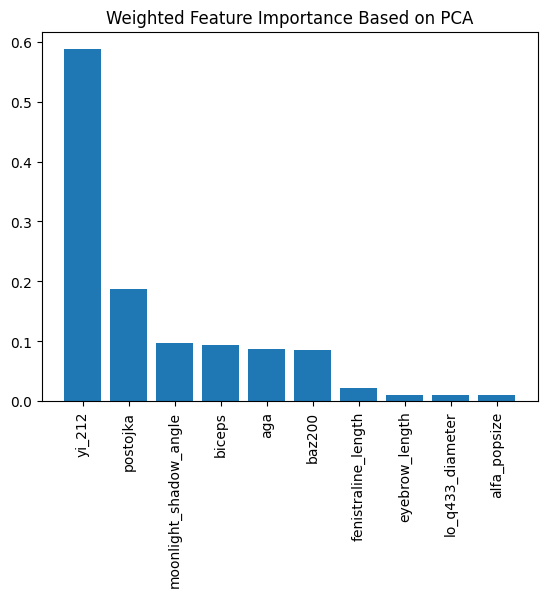

In [235]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt

pca = PCA()
pca.fit(X)

explained_variance_ratio = pca.explained_variance_ratio_
importance = abs(pca.components_)
weighted_importance = importance * explained_variance_ratio[:, np.newaxis]
total_importance = weighted_importance.sum(axis=0)

feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Total Importance': total_importance
})

sorted_features = feature_importance_df.sort_values(by='Total Importance', ascending=False)
top_features = sorted_features.head(10)
print("Top 10 most important features based on weighted PCA:")
print(top_features)

X_selected = X[top_features['Feature']]

plt.bar(top_features['Feature'], top_features['Total Importance'])
plt.xticks(rotation=90)
plt.title("Weighted Feature Importance Based on PCA")
plt.show()

Итог: попробовав отобрать колонки с помощью PCA и обучиться для разделения на 5 кластеров, я не пришел к желаемому результату, поэтому посмотрим на распределения в данных и посмотрим, какие можно взять.

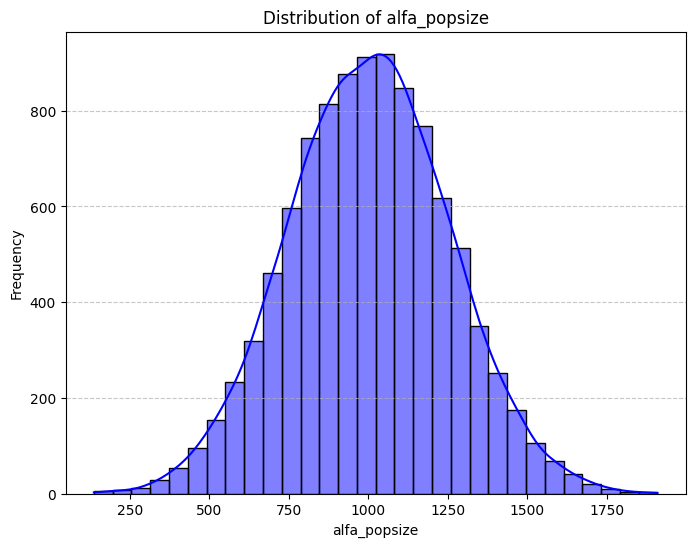

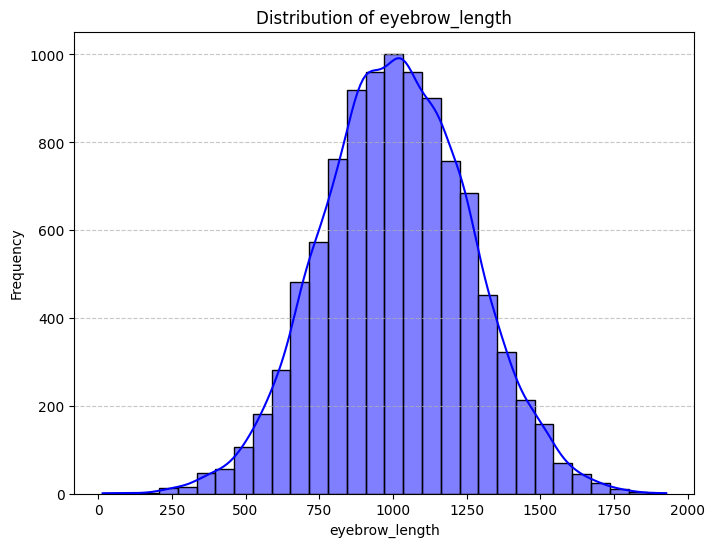

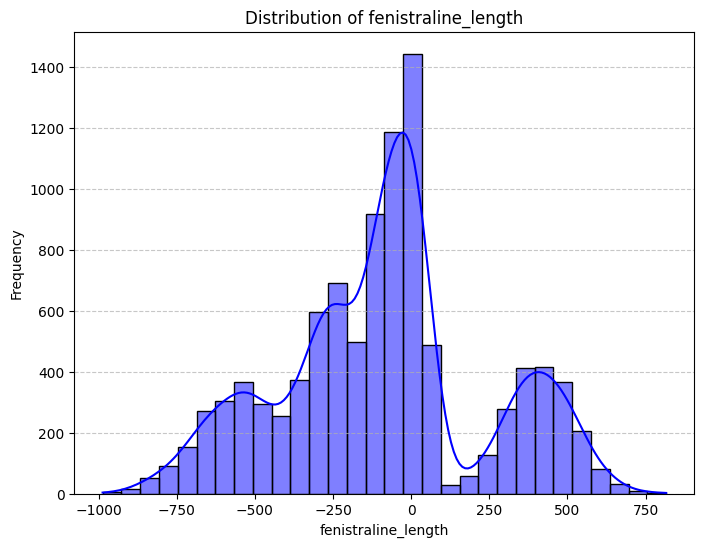

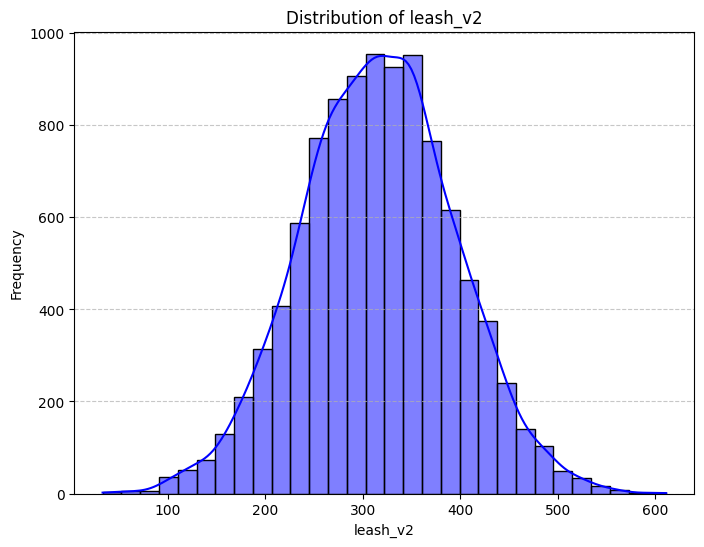

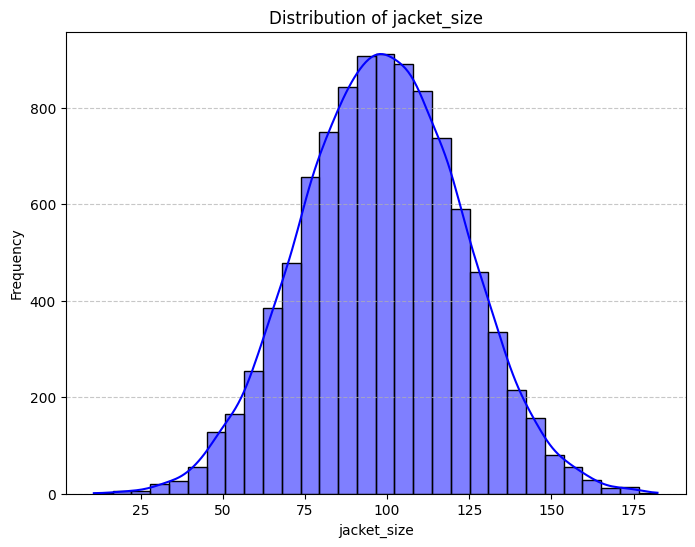

...

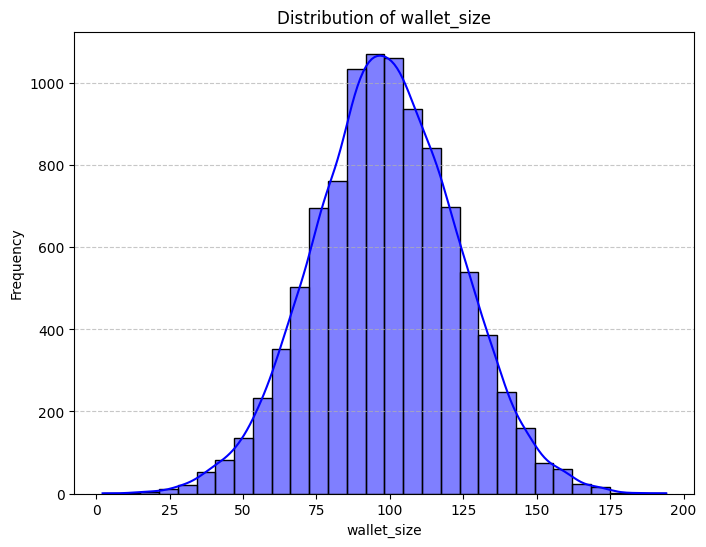

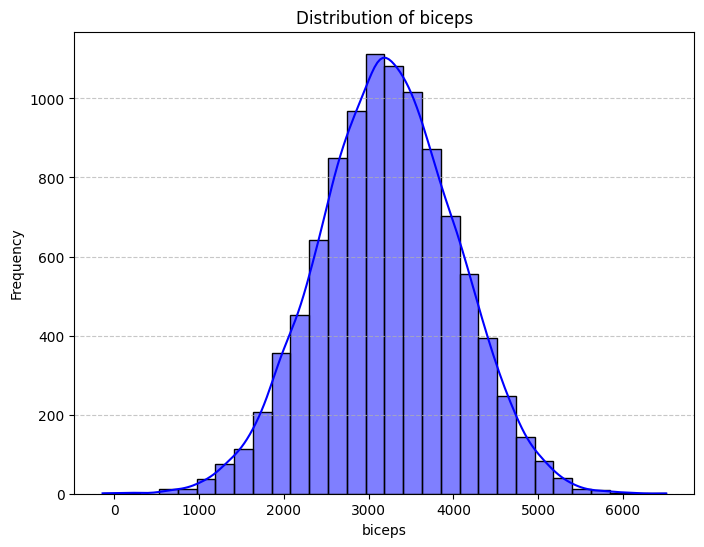

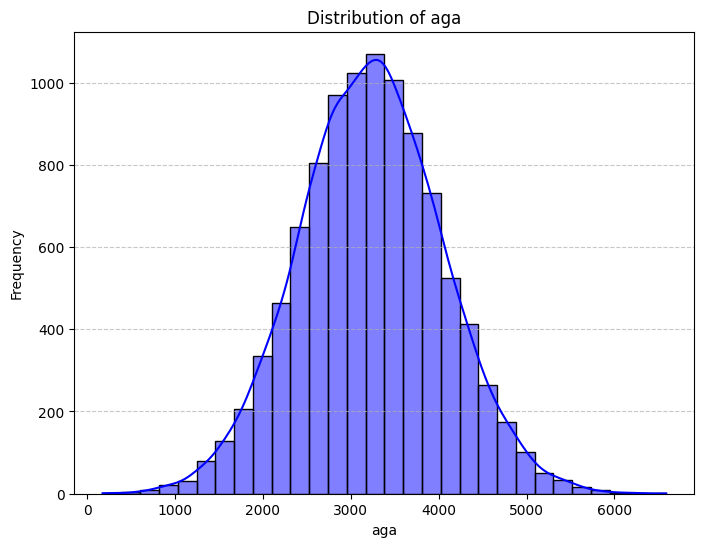

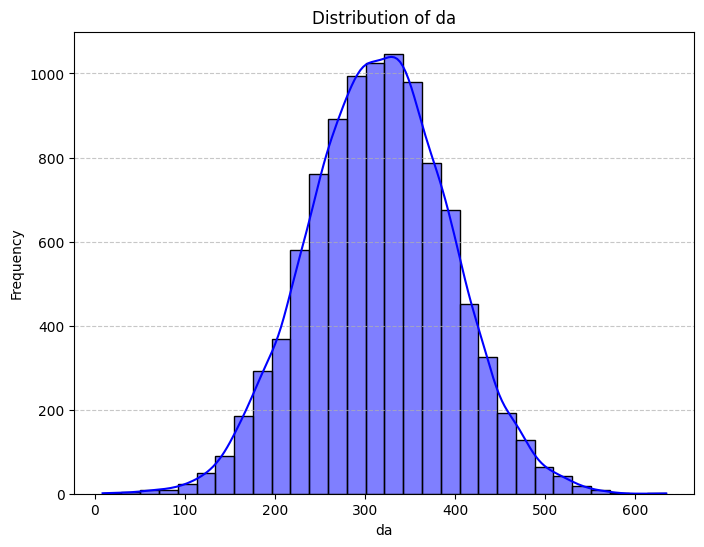

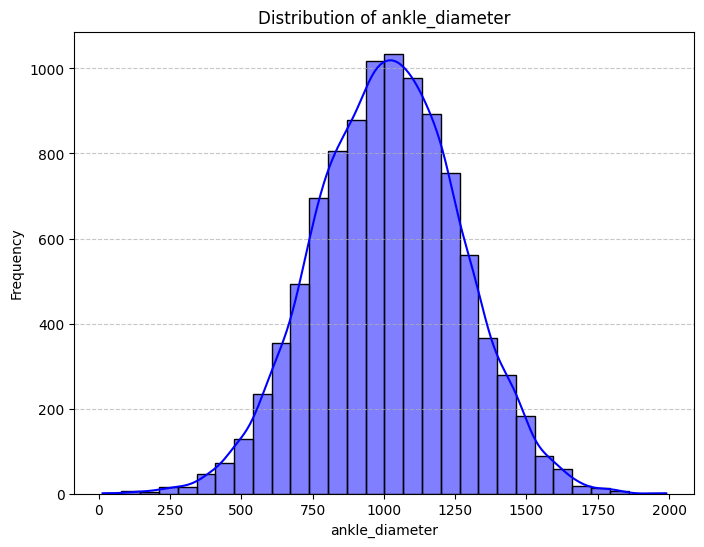

In [315]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_column_distributions(data, columns=None):
    if columns is None:
        columns = data.columns

    for column in columns:
        plt.figure(figsize=(8, 6))
        sns.histplot(data[column], kde=True, bins=30, color='blue')
        plt.title(f"Distribution of {column}")
        plt.xlabel(column)
        plt.ylabel("Frequency")
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.show()

plot_column_distributions(X)

Попробуем взять сначала те, у кого распределение отличается от нормального.

In [312]:
columns_to_select = ['fenistraline_length', 'holy_spirit', 'postojka', 'baz200']

data = X[columns_to_select]

data.head()

,fenistraline_length,holy_spirit,postojka,baz200
0,352.754646,70.388229,267.221799,1945.568168
1,-348.578448,-8.442866,199.800693,-898.047833
2,-36.358379,-20.265494,-519.780573,18.047033
3,293.866657,89.402673,1378.205958,1996.256374
4,-724.730649,-1.074858,1195.690980,363.735487


In [280]:
%%time
import umap
import os

data_scaled = scaler.fit_transform(data)

embedding = umap.UMAP(
    n_neighbors=15,
    min_dist=0.01,
    #a=1,
    b=0.15,
    metric='cosine',
    n_jobs=os.cpu_count(),
    verbose=True,
).fit_transform(data_scaled)

embedding_plotter(embedding)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



UMAP(angular_rp_forest=True, b=0.15, metric='cosine', min_dist=0.01, n_jobs=2, verbose=True)
Wed Dec 25 00:05:56 2024 Construct fuzzy simplicial set
Wed Dec 25 00:05:56 2024 Finding Nearest Neighbors
Wed Dec 25 00:05:56 2024 Building RP forest with 10 trees
Wed Dec 25 00:05:56 2024 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	Stopping threshold met -- exiting after 2 iterations
Wed Dec 25 00:05:57 2024 Finished Nearest Neighbor Search
Wed Dec 25 00:05:57 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Wed Dec 25 00:06:17 2024 Finished embedding


CPU times: user 25.3 s, sys: 453 ms, total: 25.8 s
Wall time: 21.6 s


In [335]:
%%time
import openTSNE

init = openTSNE.initialization.pca(data, random_state=911)
# openTSNE.initialization.rescale(init, target_std=0.0001, inplace=True) # родные можно не скейлить, там скейлинг вшит

affinities = openTSNE.affinity.PerplexityBasedNN(data, perplexity=40, metric='cosine', method='hnsw', n_jobs=os.cpu_count(), random_state=911)

embedding_best = openTSNE.TSNEEmbedding(
    init,
    affinities,
    dof=0.3, # <----------
    n_jobs=os.cpu_count(),
    verbose=True,
    optimizer=None
)

# EARLY EXAGGERATION
embedding_best = embedding_best.optimize(n_iter=250, exaggeration=18, momentum=0.5)

embedding_plotter(embedding_best)

# BASIC EXAGGERATION
embedding_best = embedding_best.optimize(n_iter=500, exaggeration=4, momentum=0.5)

embedding_plotter(embedding_best)

===> Running optimization with exaggeration=18.00, lr=555.56 for 250 iterations...
Iteration   50, KL divergence 5.0986, 50 iterations in 2.2140 sec
Iteration  100, KL divergence 4.7321, 50 iterations in 2.2274 sec
Iteration  150, KL divergence 4.6196, 50 iterations in 2.1827 sec
Iteration  200, KL divergence 4.5593, 50 iterations in 4.1662 sec
Iteration  250, KL divergence 4.5177, 50 iterations in 2.6908 sec
   --> Time elapsed: 13.49 seconds


===> Running optimization with exaggeration=4.00, lr=2500.00 for 500 iterations...
Iteration   50, KL divergence 4.2368, 50 iterations in 2.2752 sec
Iteration  100, KL divergence 4.1463, 50 iterations in 2.2529 sec
Iteration  150, KL divergence 4.0902, 50 iterations in 2.2844 sec
Iteration  200, KL divergence 4.0495, 50 iterations in 4.1174 sec
Iteration  250, KL divergence 4.0172, 50 iterations in 2.8458 sec
Iteration  300, KL divergence 3.9895, 50 iterations in 2.2159 sec
Iteration  350, KL divergence 3.9660, 50 iterations in 2.2374 sec
Iteration  400, KL divergence 3.9457, 50 iterations in 2.2834 sec
Iteration  450, KL divergence 3.9271, 50 iterations in 3.0319 sec
Iteration  500, KL divergence 3.9095, 50 iterations in 3.5834 sec
   --> Time elapsed: 27.14 seconds


CPU times: user 1min 7s, sys: 167 ms, total: 1min 7s
Wall time: 44.3 s


Ура! Получил 5 кластеров. Интересно, что будет, если взять все остальные, то есть "нормальные" признаки и обучиться на них.

In [245]:
tr = X.drop(columns=columns_to_select)
tr

,alfa_popsize,eyebrow_length,leash_v2,jacket_size,poloka_dash,durk_durk_3d,noopster,yi_212,lo_q433_diameter,hops_mops,...,turilla_jet,weight,moonlight_shadow_angle,jister_ml,leg_pollution,wallet_size,biceps,aga,da,ankle_diameter
0,1273.210288,702.271017,231.456804,135.162385,346.578535,162.812146,21.265403,11621.870767,1406.690293,28.987851,...,12.817179,15.780798,3988.159803,15.027182,105.348660,77.565442,2231.976885,3356.206251,293.846039,1197.658371
1,1762.800555,552.176524,302.617511,66.096273,263.098188,103.495658,29.978779,8803.271529,947.168195,31.483856,...,9.937281,12.075288,5292.966511,12.453356,86.882948,78.007788,3301.213697,5074.654575,351.400080,873.291874
2,1154.081932,1119.631765,200.098293,125.907321,334.439139,92.247154,29.199713,10654.563209,1053.819449,22.830896,...,10.743006,8.756796,3856.035673,9.495362,116.418115,116.255086,3092.423116,3994.874963,335.185582,917.447816
3,1181.661571,1320.341225,283.972621,93.459372,187.442851,81.806588,35.836450,5910.168494,1213.959223,11.285045,...,12.429817,11.421948,2717.142060,11.670682,131.664278,83.969841,3367.527054,2292.256561,351.901315,1074.534454
4,751.251638,998.132123,420.987379,60.963099,360.790557,121.554328,31.706275,9334.210234,907.358946,47.967913,...,12.065884,13.341130,3085.229342,9.853778,65.249706,100.545740,3612.973208,2899.235214,381.034647,1291.965098
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1137.424408,688.857438,359.489998,129.683610,204.562443,95.645700,30.638093,7479.653087,875.929386,11.477436,...,11.031228,11.272852,853.655181,9.978489,67.999854,80.942708,3128.648509,2521.916972,324.780635,741.554471
9996,913.314659,859.295109,245.904131,77.807249,210.272221,78.089080,37.442741,16328.490534,1106.544337,34.296580,...,13.409530,13.714980,2348.817593,11.211519,126.782365,136.199706,3412.368087,3085.193759,371.102727,964.564360
9997,1133.345522,1042.954915,381.826616,116.520283,381.432154,89.055504,28.955985,16455.331564,751.482701,35.985020,...,12.424673,12.504124,2797.610181,11.842874,113.771209,76.383984,2972.426857,2482.928050,185.922537,956.117409
9998,713.240822,830.693428,262.265291,105.215648,321.509325,104.694268,36.520347,9593.318754,1317.318414,38.033890,...,9.752806,9.727836,2166.196991,14.512985,75.965236,96.475552,4224.427711,1885.344082,320.413597,1465.775898


In [251]:
%%time
import umap
import os

embedding = umap.UMAP(
    n_neighbors=30,
    min_dist=0.001,
    #a=10,
    b=0.3,
    metric='cosine',
    n_jobs=os.cpu_count(),
    verbose=True,
).fit_transform(tr)

embedding_plotter(embedding)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



UMAP(angular_rp_forest=True, b=0.3, metric='cosine', min_dist=0.001, n_jobs=2, n_neighbors=30, verbose=True)
Tue Dec 24 22:21:56 2024 Construct fuzzy simplicial set
Tue Dec 24 22:21:56 2024 Finding Nearest Neighbors
Tue Dec 24 22:21:56 2024 Building RP forest with 10 trees
Tue Dec 24 22:21:56 2024 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	Stopping threshold met -- exiting after 2 iterations
Tue Dec 24 22:21:59 2024 Finished Nearest Neighbor Search
Tue Dec 24 22:21:59 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Tue Dec 24 22:22:39 2024 Finished embedding


CPU times: user 33.8 s, sys: 442 ms, total: 34.2 s
Wall time: 45.6 s


In [252]:
%%time
import openTSNE

init = openTSNE.initialization.pca(tr, random_state=911)
# openTSNE.initialization.rescale(init, target_std=0.0001, inplace=True) # родные можно не скейлить, там скейлинг вшит

affinities = openTSNE.affinity.PerplexityBasedNN(tr, perplexity=40, metric='cosine', method='hnsw', n_jobs=os.cpu_count(), random_state=911)

embedding = openTSNE.TSNEEmbedding(
    init,
    affinities,
    dof=0.3, # <----------
    n_jobs=os.cpu_count(),
    verbose=True,
    optimizer=None
)

# EARLY EXAGGERATION
embedding = embedding.optimize(n_iter=250, exaggeration=18, momentum=0.5)

embedding_plotter(embedding)

# BASIC EXAGGERATION
embedding = embedding.optimize(n_iter=500, exaggeration=4, momentum=0.5)

embedding_plotter(embedding)

===> Running optimization with exaggeration=18.00, lr=555.56 for 250 iterations...
Iteration   50, KL divergence 5.2742, 50 iterations in 2.3200 sec
Iteration  100, KL divergence 5.1394, 50 iterations in 2.3177 sec
Iteration  150, KL divergence 5.1371, 50 iterations in 3.8709 sec
Iteration  200, KL divergence 5.1371, 50 iterations in 3.1519 sec
Iteration  250, KL divergence 5.1371, 50 iterations in 2.3208 sec
   --> Time elapsed: 13.99 seconds


===> Running optimization with exaggeration=4.00, lr=2500.00 for 500 iterations...
Iteration   50, KL divergence 4.7199, 50 iterations in 2.3940 sec
Iteration  100, KL divergence 4.7037, 50 iterations in 2.3272 sec
Iteration  150, KL divergence 4.6971, 50 iterations in 4.2563 sec
Iteration  200, KL divergence 4.6899, 50 iterations in 2.4674 sec
Iteration  250, KL divergence 4.6765, 50 iterations in 2.3644 sec
Iteration  300, KL divergence 4.6618, 50 iterations in 2.3190 sec
Iteration  350, KL divergence 4.6485, 50 iterations in 2.3178 sec
Iteration  400, KL divergence 4.6381, 50 iterations in 3.9591 sec
Iteration  450, KL divergence 4.6292, 50 iterations in 2.8242 sec
Iteration  500, KL divergence 4.6217, 50 iterations in 2.3623 sec
   --> Time elapsed: 27.60 seconds


CPU times: user 1min 10s, sys: 227 ms, total: 1min 10s
Wall time: 45.3 s


Итог: самый лучший результат мы получили на "необычных" признаках.

### 2.2 Кластеризация (5 баллов)

Давайте теперь разобьем получившийся эмбеддинг на кластеры. Для этого выберите алгоритм кластеризации, который по-вашему сможет справиться с задачей.
Объясните свой выбор, а также выбор гиперпараметров. Запустите кластеризацию и отрисуйте получившиеся кластеры. Сделайте так, чтобы кластеры получились максимально адекватными (чем адекватней, тем больше баллов :).

In [286]:
from sklearn.cluster import KMeans

km = KMeans(5)
km_labels = km.fit_predict(embedding_best)

data['km_labels'] = km_labels
embedding_plotter(
    embedding = embedding_best,
    data = data,
    hue = 'km_labels',
    hover = columns_to_select
)

<ipython-input-286-ff8b7684db61>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Объяснение выбора алгоритма.
Я выбрал KMeans

1) как один из самых простых с учетом того, что нам в явном виде заранее задано необходимое число кластеров.

2) он работает быстрее, чем HDBSCAN, а также он работает очень хорошо, если ему на вход подать хорошо отделимые кластеры

Теперь у нас есть кластеризация, которую можно отправить специалистам! Это почти все!

Напоследок, попробуйте получить такую же кластеризацию, запустив алгоритм на пространстве размерности больше трех. Выберите адекватное подмножество признаков и алгоритм.
Выберите метрику качества кластеризации, которую будете использовать. Объясните свой выбор.

В качестве метрики качества кластеризации я выбрал silhouette_score, потому что этот коэффициент является универсальным и подходит для большинства задач, так как не требует наличия меток.

Посмотрим, что у нас вообще получилось в прошлом пункте по качеству.

In [287]:
from sklearn.metrics import silhouette_score

silhouette_score(embedding_best, km_labels)

0.7068380169080052

Отличный результат. Попробуем придумать как запустить на бОльшей размерности. Возьмем те же самые признаки "ненормальные".

In [317]:
%%time
import umap
import os

data_scaled = scaler.fit_transform(data)

embedding = umap.UMAP(
    n_components=3,
    n_neighbors=15,
    min_dist=0.01,
    #a=1,
    b=0.15,
    metric='cosine',
    n_jobs=os.cpu_count(),
    verbose=True,
).fit_transform(data_scaled)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



UMAP(angular_rp_forest=True, b=0.15, metric='cosine', min_dist=0.01, n_components=3, n_jobs=2, verbose=True)
Wed Dec 25 00:49:20 2024 Construct fuzzy simplicial set
Wed Dec 25 00:49:20 2024 Finding Nearest Neighbors
Wed Dec 25 00:49:20 2024 Building RP forest with 10 trees
Wed Dec 25 00:49:20 2024 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	Stopping threshold met -- exiting after 2 iterations
Wed Dec 25 00:49:21 2024 Finished Nearest Neighbor Search
Wed Dec 25 00:49:21 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Wed Dec 25 00:49:42 2024 Finished embedding
CPU times: user 24 s, sys: 447 ms, total: 24.4 s
Wall time: 21.4 s


In [318]:
embedding_plotter(embedding)

In [319]:
%%time
import umap
import os

data_scaled = scaler.fit_transform(data)

embedding = umap.UMAP(
    n_components=4,
    n_neighbors=15,
    min_dist=0.01,
    #a=1,
    b=0.15,
    metric='cosine',
    n_jobs=os.cpu_count(),
    verbose=True,
).fit_transform(data_scaled)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



UMAP(angular_rp_forest=True, b=0.15, metric='cosine', min_dist=0.01, n_components=4, n_jobs=2, verbose=True)
Wed Dec 25 00:50:16 2024 Construct fuzzy simplicial set
Wed Dec 25 00:50:16 2024 Finding Nearest Neighbors
Wed Dec 25 00:50:16 2024 Building RP forest with 10 trees
Wed Dec 25 00:50:17 2024 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	Stopping threshold met -- exiting after 2 iterations
Wed Dec 25 00:50:18 2024 Finished Nearest Neighbor Search
Wed Dec 25 00:50:18 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Wed Dec 25 00:50:45 2024 Finished embedding
CPU times: user 27.2 s, sys: 449 ms, total: 27.6 s
Wall time: 28.8 s


In [320]:
from sklearn.cluster import KMeans

km = KMeans(5)
km_labels_um4 = km.fit_predict(embedding)

silhouette_score(embedding, km_labels_um4)

0.73794127

Ого! Несмотря на то, что визуально получилось хуже, метрика получилась выше.

С помощью optuna подберите гиперпараметры, которые дают наилучшую метрику качества кластеризации (нужно попробовать не менее 21 различных адекватных вариантов).
Запустите алгоритм кластеризации с наилучшими гиперпараметрами на выбранном подмножестве признаков и отрисуйте получившиеся кластеры на вашем полученном в части 2.1 эмбеддинге.

In [322]:
#!pip install optuna

In [328]:
import optuna
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

def objective(trial):
    initialization_method = trial.suggest_categorical('initialization_method', ['k-means++', 'random'])
    num_initializations = trial.suggest_int('num_initializations', 5, 20)
    max_iterations = trial.suggest_int('max_iterations', 100, 1000)
    tolerance = trial.suggest_float('tolerance', 1e-6, 1e-2, log=True)
    clustering_algorithm = trial.suggest_categorical('clustering_algorithm', ['lloyd', 'elkan'])

    km = KMeans(
        n_clusters=5,
        init=initialization_method,
        n_init=num_initializations,
        max_iter=max_iterations,
        tol=tolerance,
        algorithm=clustering_algorithm,
        random_state=911
    )
    labels = km.fit_predict(embedding)
    score = silhouette_score(embedding, labels)
    return score

In [329]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=35)

print("Лучшие параметры:", study.best_params)
print("Лучший Silhouette Score:", study.best_value)

[I 2024-12-25 01:02:07,573] A new study created in memory with name: no-name-d017bee6-df9b-4541-9a39-47685fb89a81
[I 2024-12-25 01:02:10,180] Trial 0 finished with value: 0.7377834916114807 and parameters: {'initialization_method': 'k-means++', 'num_initializations': 18, 'max_iterations': 268, 'tolerance': 0.0026544044948483836, 'clustering_algorithm': 'lloyd'}. Best is trial 0 with value: 0.7377834916114807.
[I 2024-12-25 01:02:12,590] Trial 1 finished with value: 0.7377802133560181 and parameters: {'initialization_method': 'random', 'num_initializations': 19, 'max_iterations': 639, 'tolerance': 4.8628807423836466e-05, 'clustering_algorithm': 'elkan'}. Best is trial 0 with value: 0.7377834916114807.
[I 2024-12-25 01:02:14,670] Trial 2 finished with value: 0.7377845644950867 and parameters: {'initialization_method': 'k-means++', 'num_initializations': 7, 'max_iterations': 551, 'tolerance': 3.79900350347882e-05, 'clustering_algorithm': 'lloyd'}. Best is trial 2 with value: 0.73778456449

Лучшие параметры: {'initialization_method': 'random', 'num_initializations': 8, 'max_iterations': 623, 'tolerance': 0.004958759540216362, 'clustering_algorithm': 'lloyd'}
Лучший Silhouette Score: 0.7380595803260803


In [332]:
init_best = study.best_trial.params['initialization_method']
n_init_best = study.best_trial.params['num_initializations']
max_iter_best = study.best_trial.params['max_iterations']
tol_best = study.best_trial.params['tolerance']
algorithm_best = study.best_trial.params['clustering_algorithm']

init_best, n_init_best, max_iter_best, tol_best, algorithm_best

('random', 8, 623, 0.004958759540216362, 'lloyd')

In [336]:
from sklearn.cluster import KMeans

km = KMeans(
    n_clusters = 5,
    init = init_best,
    n_init = n_init_best,
    max_iter = max_iter_best,
    tol = tol_best,
    algorithm = algorithm_best,
    random_state = 911
)
km_labels = km.fit_predict(embedding_best)

data['km_labels'] = km_labels
embedding_plotter(
    embedding = embedding_best,
    data = data,
    hue = 'km_labels',
    hover = columns_to_select
)

<ipython-input-336-dde0c9214525>:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Какие выводы можно сделать из увиденного?

Для себя я понял, что отбор признаков это очень важная часть пайплайна - благодаря ей я получил необходимую кластеризацию. Также я понял, что использование всех данных может быть избыточно - это и более медленно, и более шумно.

# Ура! Всем хорошего нового года!  |:--)